# Angular Response of the detector

In [2]:
%load_ext autoreload
%autoreload 2

import numpy as np
#import jax.numpy as np
from numpy import cos, sin, pi, sqrt, arctan2
from pypack import detectors as det
from pypack import pls
import matplotlib.pyplot as plt
import healpy as hp
from healpy.newvisufunc import projview, newprojplot
from multiprocessing import Pool
from concurrent.futures import ProcessPoolExecutor, as_completed
from tqdm import tqdm
from numba import  jit
from scipy.integrate import simpson
from pypack import overlap,  pls, skymap, nell
from scipy.special import sph_harm
from mpmath import spherharm
from scipy.interpolate import interp1d  
from astropy.cosmology import Planck15


cosmo = Planck15
H0 =  cosmo.H0.to('1/s').value

c = 299792458 #m/s

plt.rcParams['figure.dpi'] = 300
plt.rcParams['font.size'] = 20
plt.rcParams['axes.labelsize'] = 20
plt.rcParams['axes.titlesize'] = 20
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
plt.rcParams['legend.fontsize'] = 20
plt.rcParams['lines.linewidth'] = 3

# LIGO

In [15]:
f = np.logspace(1, 3, 30)

In [23]:
import pickle
from tqdm.notebook import tqdm, trange

LIGO_Rell = {0:{},
            1:{},
            2:{},
            3:{}}


for ell in tqdm(LIGO_Rell.keys()):
    for pol in ['t', 'v', 's']:
        LIGO_Rell[ell][pol] = nell.R_ell(ell, 'LIGO L', 'LIGO H', f, pol, shift_angle=None)


with open('LIGO_Rell.pkl', 'wb') as f:
    pickle.dump(LIGO_Rell, f)


  0%|          | 0/4 [00:00<?, ?it/s]

In [24]:
with open('LIGO_Rell.pkl', 'rb') as f:
    LIGO_Rell = pickle.load(f)



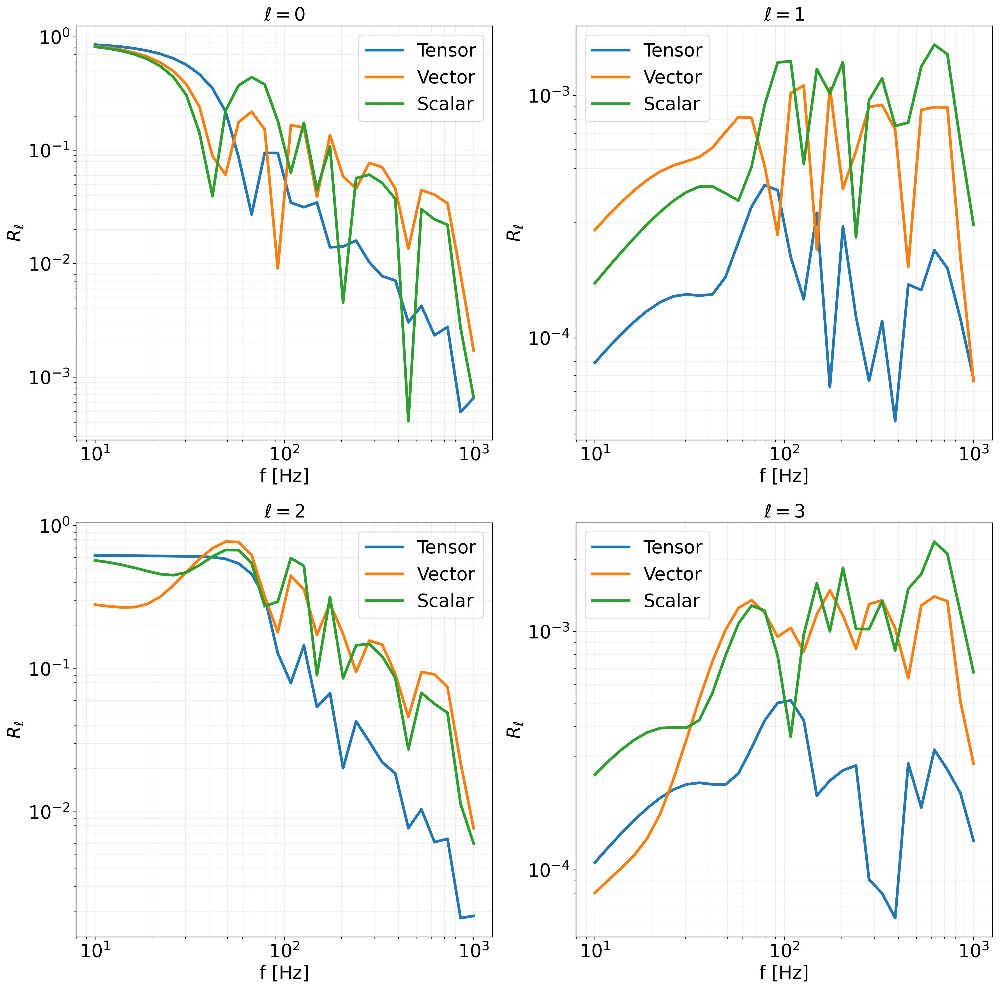

In [25]:
# create a 2x2 plot 
fig, axs = plt.subplots(2, 2, figsize=(18, 18))
f =  np.logspace(1, 3, 30)

axs[0, 0].loglog(f, [float(val) for val in list(LIGO_Rell[0]['t'])], label='Tensor')
axs[0, 0].loglog(f, [float(val) for val in list(LIGO_Rell[0]['v'])], label='Vector')
axs[0, 0].loglog(f, [float(val) for val in list(LIGO_Rell[0]['s'])], label='Scalar')
axs[0, 0].set_title(r'$\ell=0$')
axs[0, 0].legend()
axs[0, 0].set_xlabel('f [Hz]')
axs[0, 0].set_ylabel(r'$R_{\ell}$')
axs[0,0].grid(True, which='both', alpha=0.2)

axs[0, 1].loglog(f, [float(val) for val in list(LIGO_Rell[1]['t'])], label='Tensor')
axs[0, 1].loglog(f, [float(val) for val in list(LIGO_Rell[1]['v'])], label='Vector')
axs[0, 1].loglog(f, [float(val) for val in list(LIGO_Rell[1]['s'])], label='Scalar')
axs[0, 1].set_title(r'$\ell=1$')
axs[0, 1].legend()
axs[0, 1].set_xlabel('f [Hz]')
axs[0, 1].set_ylabel(r'$R_{\ell}$')
axs[0,1].grid(True, which='both', alpha=0.2)

axs[1, 0].loglog(f, [float(val) for val in list(LIGO_Rell[2]['t'])], label='Tensor')
axs[1, 0].loglog(f, [float(val) for val in list(LIGO_Rell[2]['v'])], label='Vector')
axs[1, 0].loglog(f, [float(val) for val in list(LIGO_Rell[2]['s'])], label='Scalar')
axs[1, 0].set_title(r'$\ell=2$')
axs[1, 0].legend()
axs[1, 0].set_xlabel('f [Hz]')
axs[1, 0].set_ylabel(r'$R_{\ell}$')
axs[1,0].grid(True, which='both', alpha=0.2)

axs[1, 1].loglog(f, [float(val) for val in list(LIGO_Rell[3]['t'])], label='Tensor')
axs[1, 1].loglog(f, [float(val) for val in list(LIGO_Rell[3]['v'])], label='Vector')
axs[1, 1].loglog(f, [float(val) for val in list(LIGO_Rell[3]['s'])], label='Scalar')
axs[1, 1].set_title(r'$\ell=3$')
axs[1, 1].legend()
axs[1, 1].set_xlabel('f [Hz]')
axs[1, 1].set_ylabel(r'$R_{\ell}$')
axs[1,1].grid(True, which='both', alpha=0.2)




Sensitivity to l multipoles

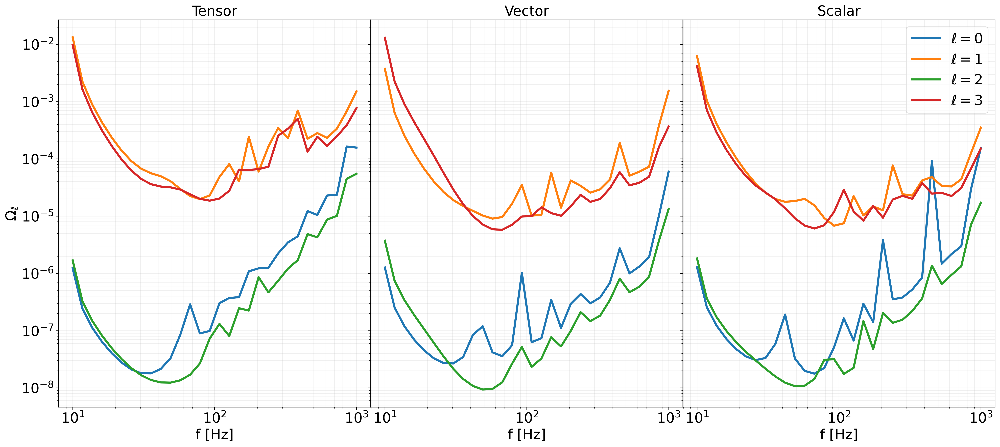

In [26]:
N0_LIGO_t = nell.Omega_ell('LIGO H', 'LIGO L', LIGO_Rell[0]['t'], f)
N1_LIGO_t = nell.Omega_ell('LIGO H', 'LIGO L', LIGO_Rell[1]['t'], f)
N2_LIGO_t = nell.Omega_ell('LIGO H', 'LIGO L', LIGO_Rell[2]['t'], f)
N3_LIGO_t = nell.Omega_ell('LIGO H', 'LIGO L', LIGO_Rell[3]['t'], f)

N0_LIGO_v = nell.Omega_ell('LIGO H', 'LIGO L', LIGO_Rell[0]['v'], f)
N1_LIGO_v = nell.Omega_ell('LIGO H', 'LIGO L', LIGO_Rell[1]['v'], f)
N2_LIGO_v = nell.Omega_ell('LIGO H', 'LIGO L', LIGO_Rell[2]['v'], f)
N3_LIGO_v = nell.Omega_ell('LIGO H', 'LIGO L', LIGO_Rell[3]['v'], f)

N0_LIGO_s = nell.Omega_ell('LIGO H', 'LIGO L', LIGO_Rell[0]['s'], f)
N1_LIGO_s = nell.Omega_ell('LIGO H', 'LIGO L', LIGO_Rell[1]['s'], f)
N2_LIGO_s = nell.Omega_ell('LIGO H', 'LIGO L', LIGO_Rell[2]['s'], f)
N3_LIGO_s = nell.Omega_ell('LIGO H', 'LIGO L', LIGO_Rell[3]['s'], f)


# make three plots for each polarization

fig, axs = plt.subplots(1, 3, figsize=(24, 10), sharey=True)

plt.subplots_adjust(wspace=0, hspace=0)

axs[0].loglog(f, N0_LIGO_t, label=r'$\ell=0$')
axs[0].loglog(f, N1_LIGO_t, label=r'$\ell=1$')
axs[0].loglog(f, N2_LIGO_t, label=r'$\ell=2$')
axs[0].loglog(f, N3_LIGO_t, label=r'$\ell=3$')
#axs[0].legend()
axs[0].set_xlabel('f [Hz]')
axs[0].set_ylabel(r'$\Omega_{\ell}$')
axs[0].set_title('Tensor')
axs[0].grid(True, which='both', alpha=0.2)

axs[1].loglog(f, N0_LIGO_v, label=r'$\ell=0$')
axs[1].loglog(f, N1_LIGO_v, label=r'$\ell=1$')
axs[1].loglog(f, N2_LIGO_v, label=r'$\ell=2$')
axs[1].loglog(f, N3_LIGO_v, label=r'$\ell=3$')
#axs[1].legend()
axs[1].set_xlabel('f [Hz]')
axs[1].set_title('Vector')
axs[1].grid(True, which='both', alpha=0.2)

axs[2].loglog(f, N0_LIGO_s, label=r'$\ell=0$')
axs[2].loglog(f, N1_LIGO_s, label=r'$\ell=1$')
axs[2].loglog(f, N2_LIGO_s, label=r'$\ell=2$')
axs[2].loglog(f, N3_LIGO_s, label=r'$\ell=3$')
axs[2].legend()
axs[2].set_xlabel('f [Hz]')
axs[2].set_title('Scalar')
axs[2].grid(True, which='both', alpha=0.2)



# ET Triangular

This clearly show that the transfer function needs to be taken into account. 

Note: the code for the trasfer function does not put the 5/2 term because in LISA things are normalized differently, however remember to add this extra factor here. Maybe in the wrapper it can be taken into account.

In [19]:
ETtr_Rell = {0:{},
            1:{},
            2:{},
            3:{}}


for ell in tqdm(ETtr_Rell.keys()):
    for pol in ['t', 'v', 's']:
        ETtr_Rell[ell][pol] = nell.R_ell(ell, 'ET A', 'ET B', f,  pol, None)




  0%|          | 0/4 [00:00<?, ?it/s]

In [16]:
with open('ETtr_Rell.pkl', 'wb') as f:
    pickle.dump(ETtr_Rell, f)

In [17]:
with open('ETtr_Rell.pkl', 'rb') as f:
    ETtr_Rell = pickle.load(f)

Text(0, 0.5, '$R_{\\ell}$')

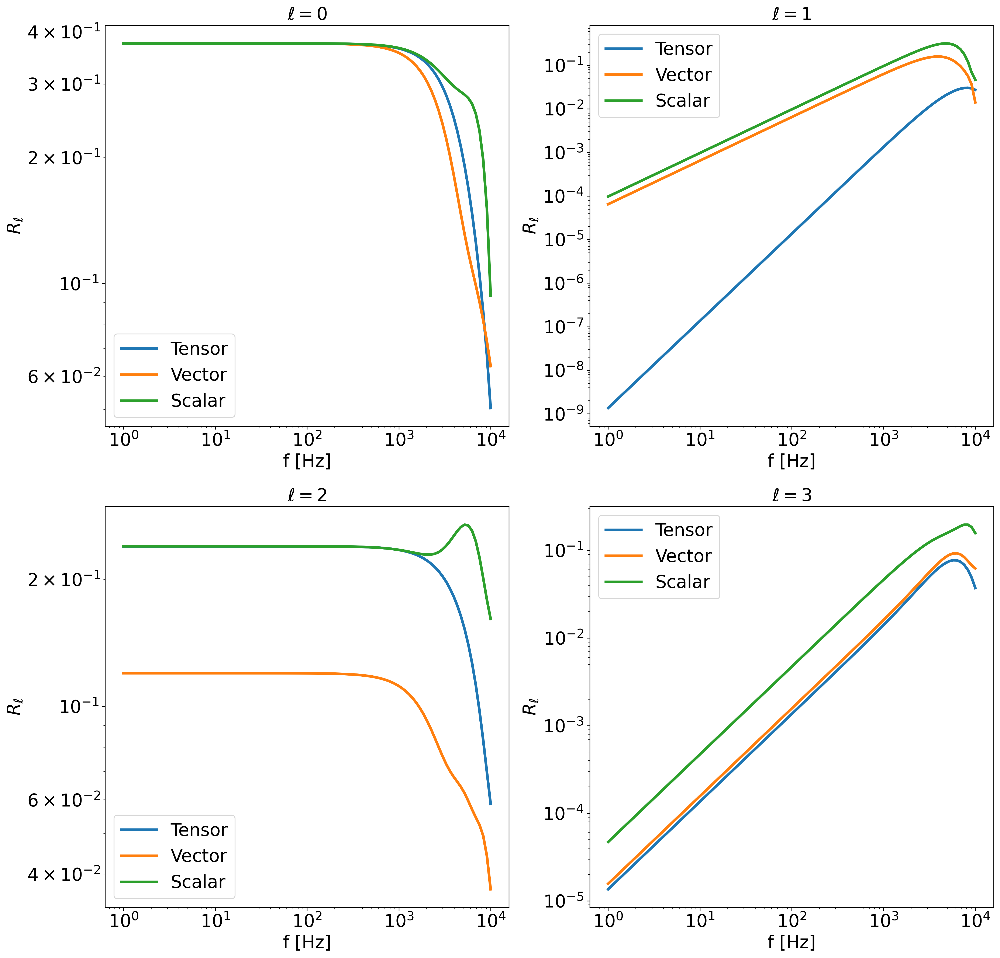

In [20]:
# create a 2x2 plot 
fig, axs = plt.subplots(2, 2, figsize=(18, 18))

f = np.logspace(0, 4, 100) 

axs[0, 0].loglog(f, ETtr_Rell[0]['t'], label='Tensor')
axs[0, 0].loglog(f, ETtr_Rell[0]['v'], label='Vector')
axs[0, 0].loglog(f, ETtr_Rell[0]['s'], label='Scalar')
axs[0, 0].set_title(r'$\ell=0$')
axs[0, 0].legend()
axs[0, 0].set_xlabel('f [Hz]')
axs[0, 0].set_ylabel(r'$R_{\ell}$')

axs[0, 1].loglog(f, ETtr_Rell[1]['t'], label='Tensor')
axs[0, 1].loglog(f, ETtr_Rell[1]['v'], label='Vector')
axs[0, 1].loglog(f, ETtr_Rell[1]['s'], label='Scalar')
axs[0, 1].set_title(r'$\ell=1$')
axs[0, 1].legend()
axs[0, 1].set_xlabel('f [Hz]')
axs[0, 1].set_ylabel(r'$R_{\ell}$')

axs[1, 0].loglog(f, ETtr_Rell[2]['t'], label='Tensor')
axs[1, 0].loglog(f, ETtr_Rell[2]['v'], label='Vector')
axs[1, 0].loglog(f, ETtr_Rell[2]['s'], label='Scalar')
axs[1, 0].set_title(r'$\ell=2$')
axs[1, 0].legend()
axs[1, 0].set_xlabel('f [Hz]')
axs[1, 0].set_ylabel(r'$R_{\ell}$')

axs[1, 1].loglog(f, ETtr_Rell[3]['t'], label='Tensor')
axs[1, 1].loglog(f, ETtr_Rell[3]['v'], label='Vector')
axs[1, 1].loglog(f, ETtr_Rell[3]['s'], label='Scalar')
axs[1, 1].set_title(r'$\ell=3$')
axs[1, 1].legend()
axs[1, 1].set_xlabel('f [Hz]')
axs[1, 1].set_ylabel(r'$R_{\ell}$')

In [22]:
N0_ET_t = nell.Omega_ell('ET A', 'ET B', ETtr_Rell[0]['t'], f)
N1_ET_t = nell.Omega_ell('ET A', 'ET B', ETtr_Rell[1]['t'], f)
N2_ET_t = nell.Omega_ell('ET A', 'ET B', ETtr_Rell[2]['t'], f)
N3_ET_t = nell.Omega_ell('ET A', 'ET B', ETtr_Rell[3]['t'], f)

N0_ET_v = nell.Omega_ell('ET A', 'ET B', ETtr_Rell[0]['v'], f)
N1_ET_v = nell.Omega_ell('ET A', 'ET B', ETtr_Rell[1]['v'], f)
N2_ET_v = nell.Omega_ell('ET A', 'ET B', ETtr_Rell[2]['v'], f)
N3_ET_v = nell.Omega_ell('ET A', 'ET B', ETtr_Rell[3]['v'], f)

N0_ET_s = nell.Omega_ell('ET A', 'ET B', ETtr_Rell[0]['s'], f)
N1_ET_s = nell.Omega_ell('ET A', 'ET B', ETtr_Rell[1]['s'], f)
N2_ET_s = nell.Omega_ell('ET A', 'ET B', ETtr_Rell[2]['s'], f)
N3_ET_s = nell.Omega_ell('ET A', 'ET B', ETtr_Rell[3]['s'], f)

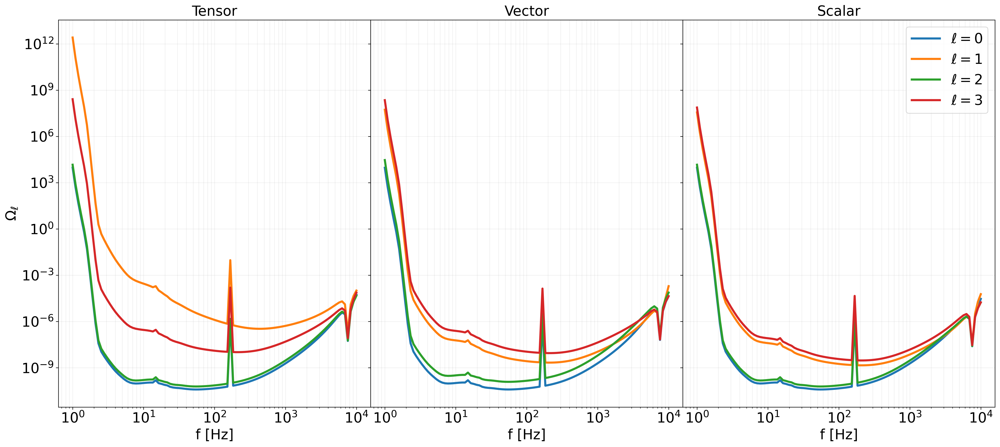

In [23]:
fig, axs = plt.subplots(1, 3, figsize=(24, 10), sharey=True)

plt.subplots_adjust(wspace=0, hspace=0)


axs[0].loglog(f, N0_ET_t, label=r'$\ell=0$')
axs[0].loglog(f, N1_ET_t, label=r'$\ell=1$')
axs[0].loglog(f, N2_ET_t, label=r'$\ell=2$')
axs[0].loglog(f, N3_ET_t, label=r'$\ell=3$')
#axs[0].legend()
axs[0].set_xlabel('f [Hz]')
axs[0].set_ylabel(r'$\Omega_{\ell}$')
axs[0].set_title('Tensor')
axs[0].grid(True, which='both', alpha=0.2)

axs[1].loglog(f, N0_ET_v, label=r'$\ell=0$')
axs[1].loglog(f, N1_ET_v, label=r'$\ell=1$')
axs[1].loglog(f, N2_ET_v, label=r'$\ell=2$')
axs[1].loglog(f, N3_ET_v, label=r'$\ell=3$')
#axs[1].legend()
axs[1].set_xlabel('f [Hz]')
axs[1].set_title('Vector')
axs[1].grid(True, which='both', alpha=0.2)

axs[2].loglog(f, N0_ET_s, label=r'$\ell=0$')
axs[2].loglog(f, N1_ET_s, label=r'$\ell=1$')
axs[2].loglog(f, N2_ET_s, label=r'$\ell=2$')
axs[2].loglog(f, N3_ET_s, label=r'$\ell=3$')
axs[2].legend()
axs[2].set_xlabel('f [Hz]')
axs[2].set_title('Scalar')
axs[2].grid(True, which='both', alpha=0.2)

# ET -2L configuration $\alpha = 0 $

In [25]:
ET2L0_Rell = {0:{},
            1:{},
            2:{},
            3:{}}


for ell in tqdm(ET2L0_Rell.keys()):
    for pol in ['t', 'v', 's']:
        ET2L0_Rell[ell][pol] = nell.R_ell(ell, 'ET L1', 'ET L2', f, pol, shift_angle=0)

with open('ET2L0_Rell.pkl', 'wb') as f:
    pickle.dump(ET2L0_Rell, f)


  0%|          | 0/4 [00:00<?, ?it/s]

Text(0, 0.5, '$R_{\\ell}$')

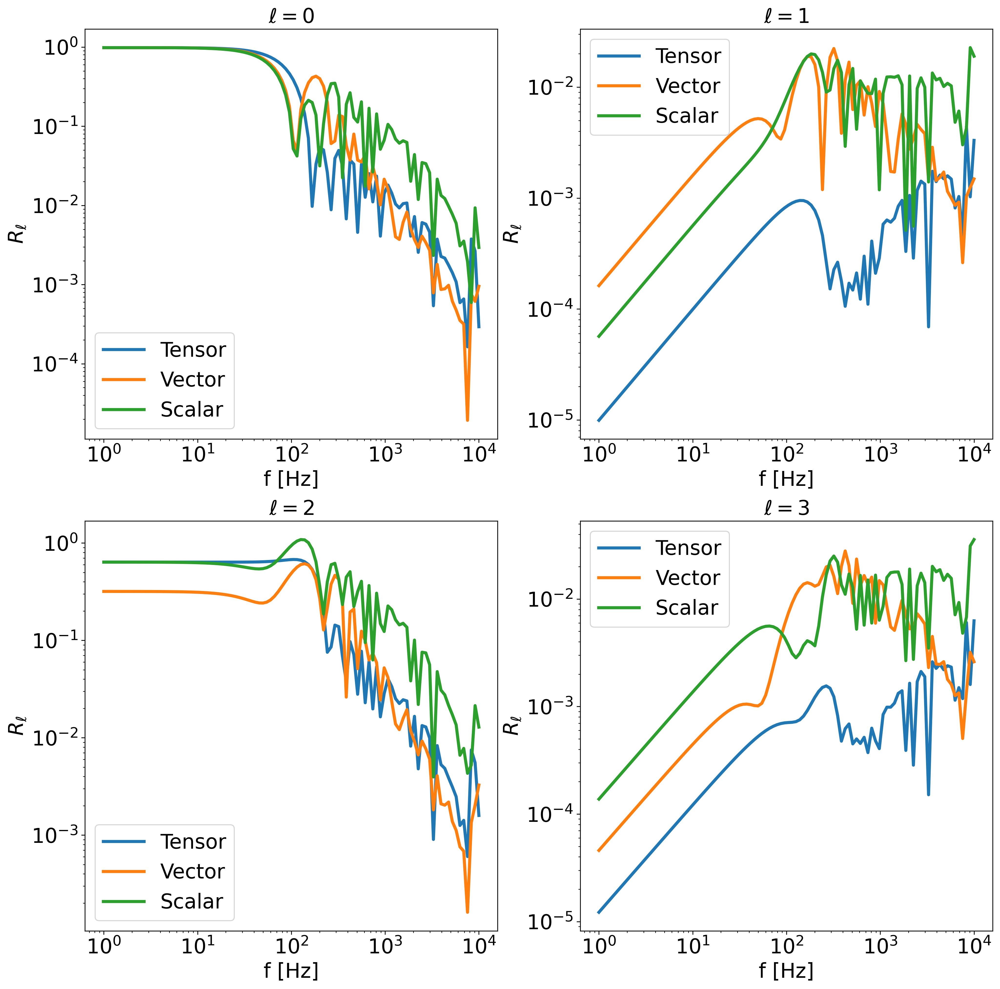

In [26]:
fig, axs = plt.subplots(2, 2, figsize=(16, 16))

f = np.logspace(0, 4, 100)

axs[0, 0].loglog(f, ET2L0_Rell[0]['t'], label='Tensor')
axs[0, 0].loglog(f, ET2L0_Rell[0]['v'], label='Vector')
axs[0, 0].loglog(f, ET2L0_Rell[0]['s'], label='Scalar')
axs[0, 0].set_title(r'$\ell=0$')
axs[0, 0].legend()
axs[0, 0].set_xlabel('f [Hz]')
axs[0, 0].set_ylabel(r'$R_{\ell}$')

axs[0, 1].loglog(f, ET2L0_Rell[1]['t'], label='Tensor')
axs[0, 1].loglog(f, ET2L0_Rell[1]['v'], label='Vector')
axs[0, 1].loglog(f, ET2L0_Rell[1]['s'], label='Scalar')
axs[0, 1].set_title(r'$\ell=1$')
axs[0, 1].legend()
axs[0, 1].set_xlabel('f [Hz]')
axs[0, 1].set_ylabel(r'$R_{\ell}$')

axs[1, 0].loglog(f, ET2L0_Rell[2]['t'], label='Tensor')
axs[1, 0].loglog(f, ET2L0_Rell[2]['v'], label='Vector')
axs[1, 0].loglog(f, ET2L0_Rell[2]['s'], label='Scalar')
axs[1, 0].set_title(r'$\ell=2$')
axs[1, 0].legend()
axs[1, 0].set_xlabel('f [Hz]')
axs[1, 0].set_ylabel(r'$R_{\ell}$')

axs[1, 1].loglog(f, ET2L0_Rell[3]['t'], label='Tensor')
axs[1, 1].loglog(f, ET2L0_Rell[3]['v'], label='Vector')
axs[1, 1].loglog(f, ET2L0_Rell[3]['s'], label='Scalar')
axs[1, 1].set_title(r'$\ell=3$')
axs[1, 1].legend()
axs[1, 1].set_xlabel('f [Hz]')
axs[1, 1].set_ylabel(r'$R_{\ell}$')

In [28]:
N0_ET_t = nell.Omega_ell('ET A', 'ET B', ET2L0_Rell[0]['t'], f)
N1_ET_t = nell.Omega_ell('ET A', 'ET B', ET2L0_Rell[1]['t'], f)
N2_ET_t = nell.Omega_ell('ET A', 'ET B', ET2L0_Rell[2]['t'], f)
N3_ET_t = nell.Omega_ell('ET A', 'ET B', ET2L0_Rell[3]['t'], f)

N0_ET_v = nell.Omega_ell('ET A', 'ET B', ET2L0_Rell[0]['v'], f)
N1_ET_v = nell.Omega_ell('ET A', 'ET B', ET2L0_Rell[1]['v'], f)
N2_ET_v = nell.Omega_ell('ET A', 'ET B', ET2L0_Rell[2]['v'], f)
N3_ET_v = nell.Omega_ell('ET A', 'ET B', ET2L0_Rell[3]['v'], f)

N0_ET_s = nell.Omega_ell('ET A', 'ET B', ET2L0_Rell[0]['s'], f)
N1_ET_s = nell.Omega_ell('ET A', 'ET B', ET2L0_Rell[1]['s'], f)
N2_ET_s = nell.Omega_ell('ET A', 'ET B', ET2L0_Rell[2]['s'], f)
N3_ET_s = nell.Omega_ell('ET A', 'ET B', ET2L0_Rell[3]['s'], f)

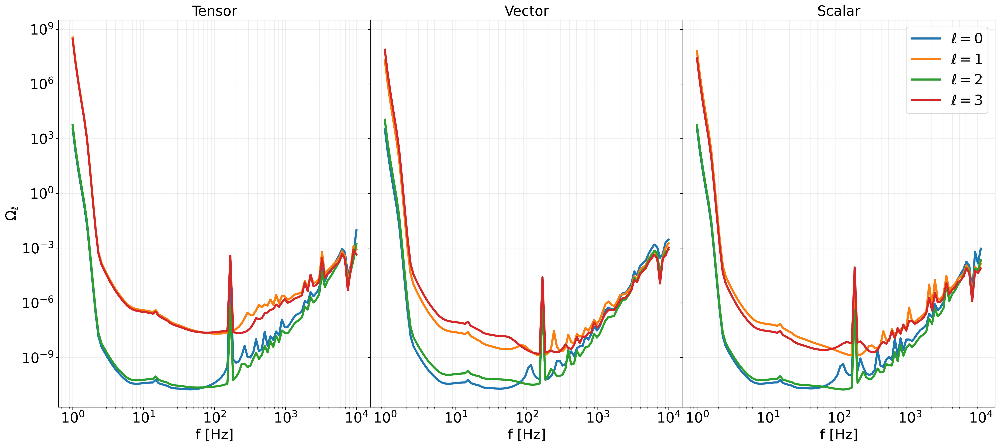

In [29]:
fig, axs = plt.subplots(1, 3, figsize=(24, 10), sharey=True)

plt.subplots_adjust(wspace=0, hspace=0)

axs[0].loglog(f, N0_ET_t, label=r'$\ell=0$')
axs[0].loglog(f, N1_ET_t, label=r'$\ell=1$')
axs[0].loglog(f, N2_ET_t, label=r'$\ell=2$')
axs[0].loglog(f, N3_ET_t, label=r'$\ell=3$')
#axs[0].legend()
axs[0].set_xlabel('f [Hz]')
axs[0].set_ylabel(r'$\Omega_{\ell}$')
axs[0].set_title('Tensor')
axs[0].grid(True, which='both', alpha=0.2)

axs[1].loglog(f, N0_ET_v, label=r'$\ell=0$')
axs[1].loglog(f, N1_ET_v, label=r'$\ell=1$')
axs[1].loglog(f, N2_ET_v, label=r'$\ell=2$')
axs[1].loglog(f, N3_ET_v, label=r'$\ell=3$')
#axs[1].legend()
axs[1].set_xlabel('f [Hz]')
axs[1].set_title('Vector')
axs[1].grid(True, which='both', alpha=0.2)

axs[2].loglog(f, N0_ET_s, label=r'$\ell=0$')
axs[2].loglog(f, N1_ET_s, label=r'$\ell=1$')
axs[2].loglog(f, N2_ET_s, label=r'$\ell=2$')
axs[2].loglog(f, N3_ET_s, label=r'$\ell=3$')
axs[2].legend()
axs[2].set_xlabel('f [Hz]')
axs[2].set_title('Scalar')
axs[2].grid(True, which='both', alpha=0.2)

# ET - 2L configuration $\alpha = 45$ deg (worst case scenario)

In [33]:
ET2L45_Rell = {0:{},
            1:{},
            2:{},
            3:{}}


for ell in tqdm(ET2L45_Rell.keys()):
    for pol in ['t', 'v', 's']:
        ET2L45_Rell[ell][pol] = nell.R_ell(ell, 'ET L1', 'ET L2', f, pol, shift_angle=np.deg2rad(45))

with open('ET2L45_Rell.pkl', 'wb') as f:
    pickle.dump(ET2L45_Rell, f)

  0%|          | 0/4 [00:00<?, ?it/s]

Text(0, 0.5, '$R_{\\ell}$')

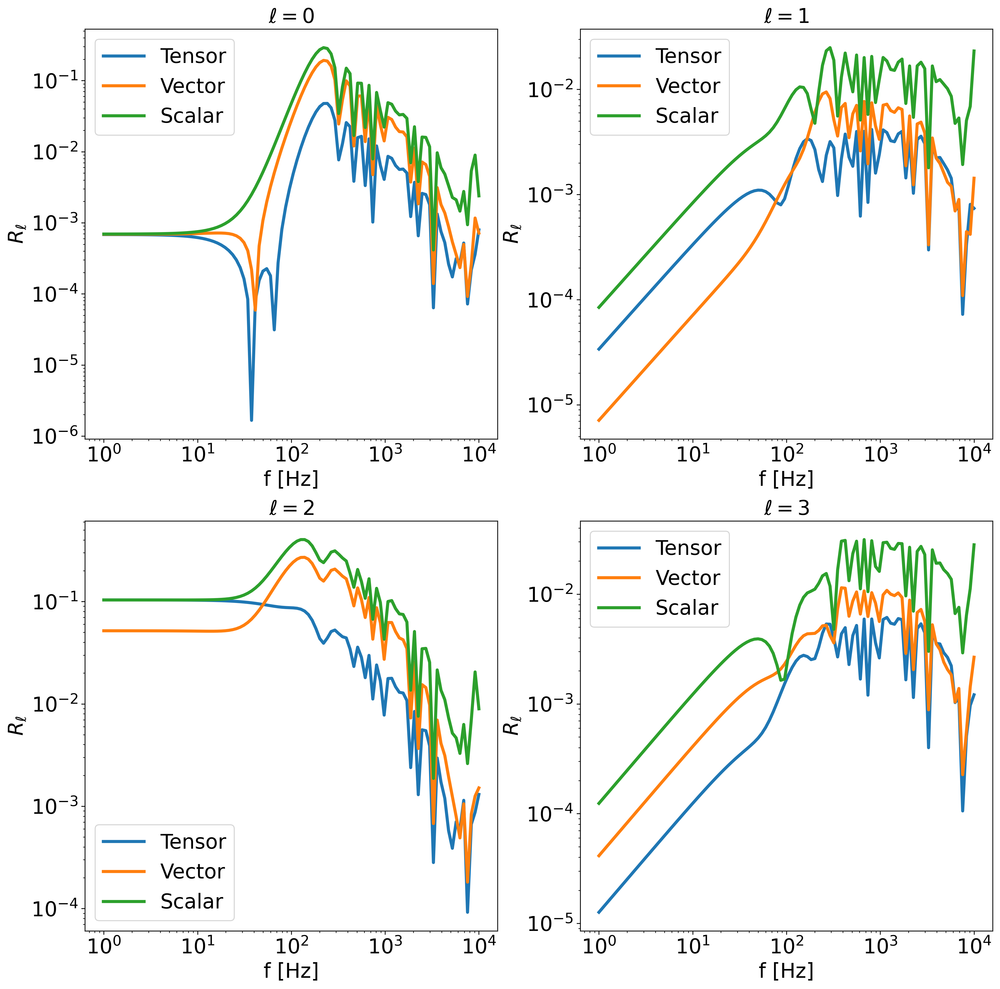

In [34]:
fig, axs = plt.subplots(2, 2, figsize=(16, 16))

f = np.logspace(0, 4, 100)

axs[0, 0].loglog(f, ET2L45_Rell[0]['t'], label='Tensor')
axs[0, 0].loglog(f, ET2L45_Rell[0]['v'], label='Vector')
axs[0, 0].loglog(f, ET2L45_Rell[0]['s'], label='Scalar')
axs[0, 0].set_title(r'$\ell=0$')
axs[0, 0].legend()
axs[0, 0].set_xlabel('f [Hz]')
axs[0, 0].set_ylabel(r'$R_{\ell}$')

axs[0, 1].loglog(f, ET2L45_Rell[1]['t'], label='Tensor')
axs[0, 1].loglog(f, ET2L45_Rell[1]['v'], label='Vector')
axs[0, 1].loglog(f, ET2L45_Rell[1]['s'], label='Scalar')
axs[0, 1].set_title(r'$\ell=1$')
axs[0, 1].legend()
axs[0, 1].set_xlabel('f [Hz]')
axs[0, 1].set_ylabel(r'$R_{\ell}$')

axs[1, 0].loglog(f, ET2L45_Rell[2]['t'], label='Tensor')
axs[1, 0].loglog(f, ET2L45_Rell[2]['v'], label='Vector')
axs[1, 0].loglog(f, ET2L45_Rell[2]['s'], label='Scalar')
axs[1, 0].set_title(r'$\ell=2$')
axs[1, 0].legend()
axs[1, 0].set_xlabel('f [Hz]')
axs[1, 0].set_ylabel(r'$R_{\ell}$')

axs[1, 1].loglog(f, ET2L45_Rell[3]['t'], label='Tensor')
axs[1, 1].loglog(f, ET2L45_Rell[3]['v'], label='Vector')
axs[1, 1].loglog(f, ET2L45_Rell[3]['s'], label='Scalar')
axs[1, 1].set_title(r'$\ell=3$')
axs[1, 1].legend()
axs[1, 1].set_xlabel('f [Hz]')
axs[1, 1].set_ylabel(r'$R_{\ell}$')

In [35]:
N0_ET_t = nell.Omega_ell('ET L1', 'ET L2', ET2L45_Rell[0]['t'], f)
N1_ET_t = nell.Omega_ell('ET L1', 'ET L2', ET2L45_Rell[1]['t'], f)
N2_ET_t = nell.Omega_ell('ET L1', 'ET L2', ET2L45_Rell[2]['t'], f)
N3_ET_t = nell.Omega_ell('ET L1', 'ET L2', ET2L45_Rell[3]['t'], f)

N0_ET_v = nell.Omega_ell('ET L1', 'ET L2', ET2L45_Rell[0]['v'], f)
N1_ET_v = nell.Omega_ell('ET L1', 'ET L2', ET2L45_Rell[1]['v'], f)
N2_ET_v = nell.Omega_ell('ET L1', 'ET L2', ET2L45_Rell[2]['v'], f)
N3_ET_v = nell.Omega_ell('ET L1', 'ET L2', ET2L45_Rell[3]['v'], f)

N0_ET_s = nell.Omega_ell('ET L1', 'ET L2', ET2L45_Rell[0]['s'], f)
N1_ET_s = nell.Omega_ell('ET L1', 'ET L2', ET2L45_Rell[1]['s'], f)
N2_ET_s = nell.Omega_ell('ET L1', 'ET L2', ET2L45_Rell[2]['s'], f)
N3_ET_s = nell.Omega_ell('ET L1', 'ET L2', ET2L45_Rell[3]['s'], f)

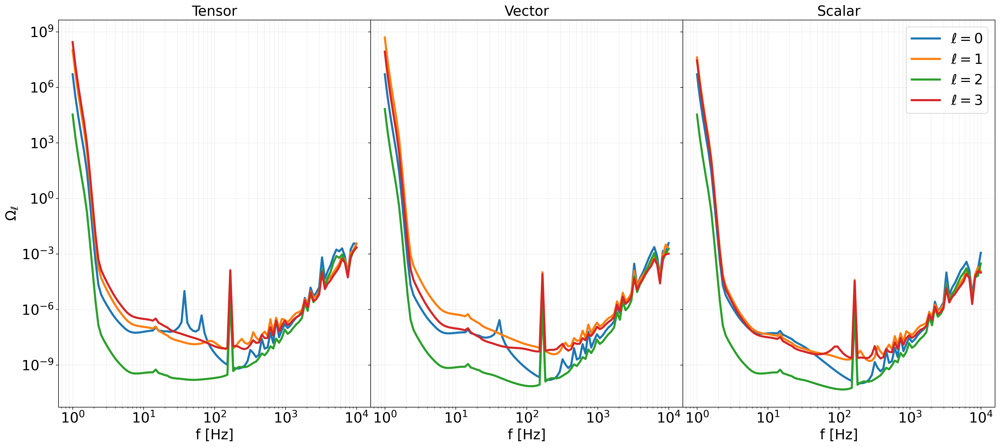

In [36]:
fig, axs = plt.subplots(1, 3, figsize=(24, 10), sharey=True)

plt.subplots_adjust(wspace=0, hspace=0)

axs[0].loglog(f, N0_ET_t, label=r'$\ell=0$')
axs[0].loglog(f, N1_ET_t, label=r'$\ell=1$')
axs[0].loglog(f, N2_ET_t, label=r'$\ell=2$')
axs[0].loglog(f, N3_ET_t, label=r'$\ell=3$')
#axs[0].legend()
axs[0].set_xlabel('f [Hz]')
axs[0].set_ylabel(r'$\Omega_{\ell}$')
axs[0].set_title('Tensor')
axs[0].grid(True, which='both', alpha=0.2)

axs[1].loglog(f, N0_ET_v, label=r'$\ell=0$')
axs[1].loglog(f, N1_ET_v, label=r'$\ell=1$')
axs[1].loglog(f, N2_ET_v, label=r'$\ell=2$')
axs[1].loglog(f, N3_ET_v, label=r'$\ell=3$')
#axs[1].legend()
axs[1].set_xlabel('f [Hz]')
axs[1].set_title('Vector')
axs[1].grid(True, which='both', alpha=0.2)

axs[2].loglog(f, N0_ET_s, label=r'$\ell=0$')
axs[2].loglog(f, N1_ET_s, label=r'$\ell=1$')
axs[2].loglog(f, N2_ET_s, label=r'$\ell=2$')
axs[2].loglog(f, N3_ET_s, label=r'$\ell=3$')
axs[2].legend()
axs[2].set_xlabel('f [Hz]')
axs[2].set_title('Scalar')
axs[2].grid(True, which='both', alpha=0.2)

# LISA

In [5]:
f = np.logspace(-5, 1-1, 30)

For even $\ell$ :


\begin{equation*}
R_{AA}^{\ell} =  R_{EE}^{\ell} = \left[ \frac{1}{4} \sum_{m= -\ell}^{+ \ell} \left| (1 + e^{-4/3 i m \pi}) R_{XX}^{\ell m} - 2 R_{XY}^{\ell m } \right|^2 \right]^{1/2}
\end{equation*}

\begin{equation*}
R_{TT}^{\ell} = \left[ \frac{1}{9} \sum_{m= -\ell}^{+ \ell} \left[  1+ 2\cos \left( \frac{2 m \pi}{3} \right)\right]^2 \left|  R_{XX}^{\ell m} + 2 R_{XY}^{\ell m } \right|^2 \right]^{1/2}
\end{equation*}

\begin{equation*}
R_{AE}^{\ell} = \left[ \frac{1}{3} \sum_{m= -\ell}^{+ \ell} \sin^2 \left( \frac{m \pi}{3} \right) \left| (1 + e^{2/3 i m \pi}) R_{XX}^{\ell m} - 2 R_{XY}^{\ell m } \right|^2 \right]^{1/2}
\end{equation*}

\begin{equation*}
R_{AT}^{\ell} = R_{ET}^{\ell} \left[ \frac{2}{3} \sum_{m= -\ell}^{+ \ell} \sin^2 \left( \frac{m \pi}{3} \right) \left| (1 + e^{2/3 i m \pi}) R_{XX}^{\ell m} + 2 R_{XY}^{\ell m } \right|^2 \right]^{1/2}
\end{equation*}

and for odd $\ell$ instead

\begin{equation*}
R_{AA}^{\ell} (f) =  R_{EE}^{\ell} (f) = R_{TT}^{\ell} (f) = 0,
\end{equation*}

\begin{equation*}
    R_{AE}^{\ell} (f) = \left[ \frac{1}{3} \sum_{m= -\ell}^{\ell} \left[ 
    1 + 2\cos \left( \frac{2 m \pi}{3} \right)\right]^2 \left|R_{XY}^{\ell m} (f) \right|^2 \right]^{1/2},
\end{equation*}

\begin{equation*}
    R_{AT}^{\ell} (f) = R_{ET}^{\ell} (f) =  \left[ \frac{1}{3} \sum_{m= -\ell}^{\ell} \sin^2 \left( \frac{m\pi}{3} \right) \left|R_{XY}^{\ell m} (f) \right|^2 \right]^{1/2}.
\end{equation*}


In [6]:
LISA_Rell = {0:{},
            1:{},
            2:{},
            3:{}}

for ell in tqdm(LISA_Rell.keys()):
    for ch in ['AA', 'AE', 'AT', 'TT']:
        if ch not in LISA_Rell[ell]:
            LISA_Rell[ell][ch] = {}
        for pol in ['t', 'v', 's']:
            LISA_Rell[ell][ch][pol] = nell.R_AET_basis(ell, ch, pol, f)

with open('LISA_Rell.pkl', 'wb') as f:
    pickle.dump(LISA_Rell, f)

  0%|          | 0/4 [00:00<?, ?it/s]

100%|██████████| 4/4 [16:03<00:00, 240.76s/it]


NameError: name 'pickle' is not defined

Text(0, 0.5, '$R_{\\ell}$')

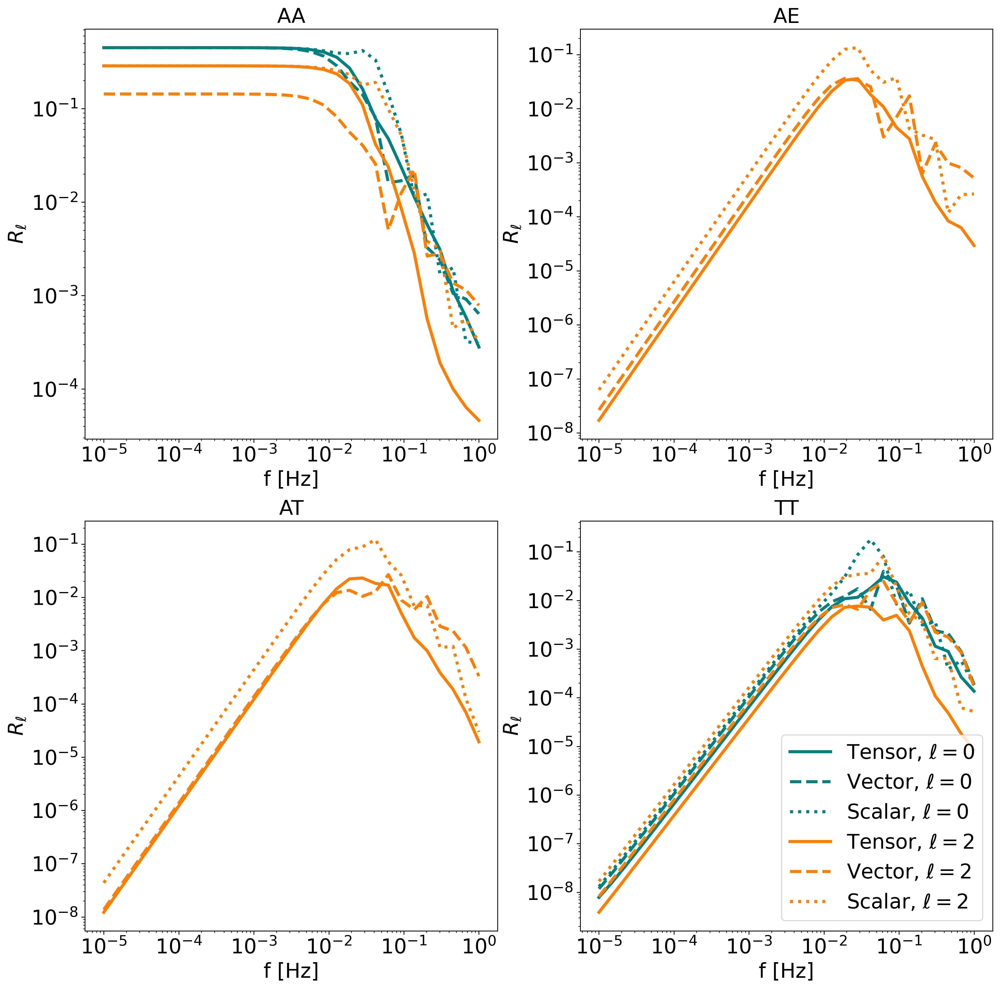

In [8]:
# plot for even l 

fig, axs = plt.subplots(2, 2, figsize=(16, 16))
f = np.logspace(-5, 1-1, 30)

axs[0, 0].loglog(f, LISA_Rell[0]['AA']['t'], color=(0, 0.5, 0.5), label=r'Tensor, $\ell = 0$')
axs[0, 0].loglog(f, LISA_Rell[0]['AA']['v'], color=(0, 0.5, 0.5), label=r'Vector, $\ell = 0$', linestyle='--')
axs[0, 0].loglog(f, LISA_Rell[0]['AA']['s'], color=(0, 0.5, 0.5), label=r'Scalar, $\ell = 0$', linestyle=':')
axs[0, 0].loglog(f, LISA_Rell[2]['AA']['t'], color=(1, 0.5, 0), label=r'Tensor, $\ell = 2$')
axs[0, 0].loglog(f, LISA_Rell[2]['AA']['v'], color=(1, 0.5, 0), label=r'Vector, $\ell = 2$', linestyle='--')
axs[0, 0].loglog(f, LISA_Rell[2]['AA']['s'], color=(1, 0.5, 0), label=r'Scalar, $\ell = 2$', linestyle=':')
axs[0, 0].set_title(r'AA')
#axs[0, 0].legend()
axs[0, 0].set_xlabel('f [Hz]')
axs[0, 0].set_ylabel(r'$R_{\ell}$')

axs[0, 1].loglog(f, LISA_Rell[0]['AE']['t'], color=(0, 0.5, 0.5), label=r'Tensor, $\ell = 0$')
axs[0, 1].loglog(f, LISA_Rell[0]['AE']['v'], color=(0, 0.5, 0.5), label=r'Vector, $\ell = 0$', linestyle='--')
axs[0, 1].loglog(f, LISA_Rell[0]['AE']['s'], color=(0, 0.5, 0.5), label=r'Scalar, $\ell = 0$', linestyle=':')
axs[0, 1].loglog(f, LISA_Rell[2]['AE']['t'], color=(1, 0.5, 0), label=r'Tensor, $\ell = 2$')
axs[0, 1].loglog(f, LISA_Rell[2]['AE']['v'], color=(1, 0.5, 0), label=r'Vector, $\ell = 2$', linestyle='--')
axs[0, 1].loglog(f, LISA_Rell[2]['AE']['s'], color=(1, 0.5, 0), label=r'Scalar, $\ell = 2$', linestyle=':')
axs[0, 1].set_title(r'AE')
#axs[0, 1].legend()
axs[0, 1].set_xlabel('f [Hz]')
axs[0, 1].set_ylabel(r'$R_{\ell}$')

axs[1, 0].loglog(f, LISA_Rell[0]['AT']['t'], color=(0, 0.5, 0.5), label=r'Tensor, $\ell = 0$')
axs[1, 0].loglog(f, LISA_Rell[0]['AT']['v'], color=(0, 0.5, 0.5), label=r'Vector, $\ell = 0$', linestyle='--')
axs[1, 0].loglog(f, LISA_Rell[0]['AT']['s'], color=(0, 0.5, 0.5), label=r'Scalar, $\ell = 0$', linestyle=':')
axs[1, 0].loglog(f, LISA_Rell[2]['AT']['t'], color=(1, 0.5, 0), label=r'Tensor, $\ell = 2$')
axs[1, 0].loglog(f, LISA_Rell[2]['AT']['v'], color=(1, 0.5, 0), label=r'Vector, $\ell = 2$', linestyle='--')
axs[1, 0].loglog(f, LISA_Rell[2]['AT']['s'], color=(1, 0.5, 0), label=r'Scalar, $\ell = 2$', linestyle=':')
axs[1, 0].set_title(r'AT')
#axs[1, 0].legend()
axs[1, 0].set_xlabel('f [Hz]')
axs[1, 0].set_ylabel(r'$R_{\ell}$')

axs[1, 1].loglog(f, LISA_Rell[0]['TT']['t'], color=(0, 0.5, 0.5), label=r'Tensor, $\ell = 0$')
axs[1, 1].loglog(f, LISA_Rell[0]['TT']['v'], color=(0, 0.5, 0.5), label=r'Vector, $\ell = 0$', linestyle='--')
axs[1, 1].loglog(f, LISA_Rell[0]['TT']['s'], color=(0, 0.5, 0.5), label=r'Scalar, $\ell = 0$', linestyle=':')
axs[1, 1].loglog(f, LISA_Rell[2]['TT']['t'], color=(1, 0.5, 0), label=r'Tensor, $\ell = 2$')
axs[1, 1].loglog(f, LISA_Rell[2]['TT']['v'], color=(1, 0.5, 0), label=r'Vector, $\ell = 2$', linestyle='--')
axs[1, 1].loglog(f, LISA_Rell[2]['TT']['s'], color=(1, 0.5, 0), label=r'Scalar, $\ell = 2$', linestyle=':')
axs[1, 1].set_title(r'TT')
axs[1, 1].legend()
axs[1, 1].set_xlabel('f [Hz]')
axs[1, 1].set_ylabel(r'$R_{\ell}$')



Text(0, 0.5, '$R_{\\ell}$')

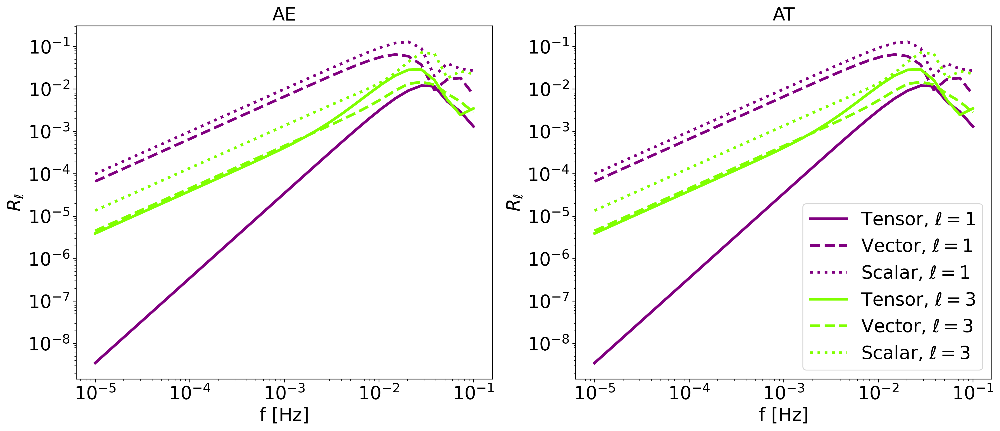

In [113]:
# plot for odd l

fig, axs = plt.subplots(1, 2, figsize=(18, 7))

axs[0].loglog(f, LISA_Rell[1]['AE']['t'], color=(0.5, 0, 0.5), label=r'Tensor, $\ell = 1$')
axs[0].loglog(f, LISA_Rell[1]['AE']['v'], color=(0.5, 0, 0.5), label=r'Vector, $\ell = 1$', linestyle='--')
axs[0].loglog(f, LISA_Rell[1]['AE']['s'], color=(0.5, 0, 0.5), label=r'Scalar, $\ell = 1$', linestyle=':')
axs[0].loglog(f, LISA_Rell[3]['AE']['t'], color=(0.5, 1, 0), label=r'Tensor, $\ell = 3$')
axs[0].loglog(f, LISA_Rell[3]['AE']['v'], color=(0.5, 1, 0), label=r'Vector, $\ell = 3$', linestyle='--')
axs[0].loglog(f, LISA_Rell[3]['AE']['s'], color=(0.5, 1, 0), label=r'Scalar, $\ell = 3$', linestyle=':')
axs[0].set_title(r'AE')
#axs[0].legend()
axs[0].set_xlabel('f [Hz]')
axs[0].set_ylabel(r'$R_{\ell}$')

axs[1].loglog(f, LISA_Rell[1]['AE']['t'], color=(0.5, 0, 0.5), label=r'Tensor, $\ell = 1$')
axs[1].loglog(f, LISA_Rell[1]['AE']['v'], color=(0.5, 0, 0.5), label=r'Vector, $\ell = 1$', linestyle='--')
axs[1].loglog(f, LISA_Rell[1]['AE']['s'], color=(0.5, 0, 0.5), label=r'Scalar, $\ell = 1$', linestyle=':')
axs[1].loglog(f, LISA_Rell[3]['AE']['t'], color=(0.5, 1, 0), label=r'Tensor, $\ell = 3$')
axs[1].loglog(f, LISA_Rell[3]['AE']['v'], color=(0.5, 1, 0), label=r'Vector, $\ell = 3$', linestyle='--')
axs[1].loglog(f, LISA_Rell[3]['AE']['s'], color=(0.5, 1, 0), label=r'Scalar, $\ell = 3$', linestyle=':')
axs[1].set_title(r'AT')
axs[1].legend()
axs[1].set_xlabel('f [Hz]')
axs[1].set_ylabel(r'$R_{\ell}$')



In [5]:
f = np.logspace(-5, -1, 30)

N0_t = nell.Omega_ell_LISA(f, 0, 't')
N1_t = nell.Omega_ell_LISA(f, 1, 't')
N2_t = nell.Omega_ell_LISA(f, 2, 't')
N3_t = nell.Omega_ell_LISA(f, 3, 't')

N0_v = nell.Omega_ell_LISA(f, 0, 'v')
N1_v = nell.Omega_ell_LISA(f, 1, 'v')
N2_v = nell.Omega_ell_LISA(f, 2, 'v')
N3_v = nell.Omega_ell_LISA(f, 3, 'v')

N0_s = nell.Omega_ell_LISA(f, 0, 's')
N1_s = nell.Omega_ell_LISA(f, 1, 's')
N2_s = nell.Omega_ell_LISA(f, 2, 's')
N3_s = nell.Omega_ell_LISA(f, 3, 's')

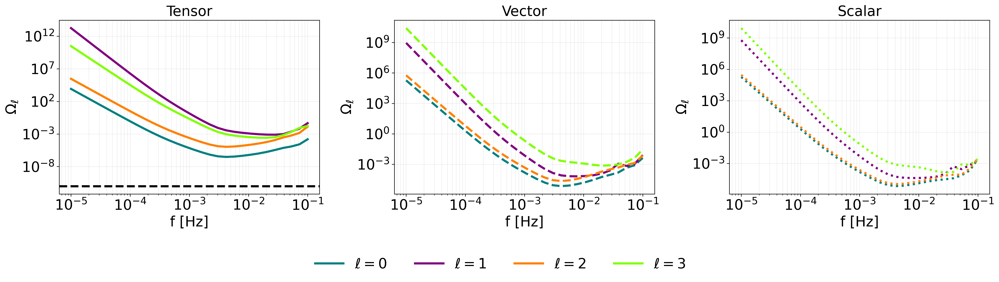

In [8]:
fig, axs = plt.subplots(1, 3, figsize=(20, 5))
# f = np.unique(np.concatenate((np.logspace(-5, -2, 30),np.linspace(1e-2,1e-1,30))))
f = np.logspace(-5, -1, 30)
# Tensor plot
axs[0].plot(f, 0.49/(np.sqrt(4* np.pi))*N0_t/np.pi, label=r'$\ell=0$', color=(0, 0.5, 0.5))
axs[0].plot(f, N1_t, label=r'$\ell=1$', color=(0.5, 0, 0.5))
axs[0].plot(f, N2_t, label=r'$\ell=2$', color=(1, 0.5, 0))
axs[0].plot(f, N3_t, label=r'$\ell=3$', color=(0.5, 1, 0))
axs[0].set_xscale('log')
axs[0].set_yscale('log')
axs[0].set_xlabel('f [Hz]')
axs[0].set_ylabel(r'$\Omega_{\ell}$')
axs[0].set_title('Tensor')
axs[0].grid(True, which='both', alpha=0.2)
axs[0].axhline(1e-11, color='black', linestyle='--')

# Vector plot
axs[1].plot(f, N0_v, label=r'$\ell=0$', linestyle='--', color=(0, 0.5, 0.5))
axs[1].plot(f, N1_v, label=r'$\ell=1$', linestyle='--', color=(0.5, 0, 0.5))
axs[1].plot(f, N2_v, label=r'$\ell=2$', linestyle='--', color=(1, 0.5, 0))
axs[1].plot(f, N3_v, label=r'$\ell=3$', linestyle='--', color=(0.5, 1, 0))
axs[1].set_xscale('log')
axs[1].set_yscale('log')
axs[1].set_xlabel('f [Hz]')
axs[1].set_ylabel(r'$\Omega_{\ell}$')
axs[1].set_title('Vector')
axs[1].grid(True, which='both', alpha=0.2)

# Scalar plot
axs[2].plot(f, N0_s, label=r'$\ell=0$', linestyle=':', color=(0, 0.5, 0.5))
axs[2].plot(f, N1_s, label=r'$\ell=1$', linestyle=':',  color=(0.5, 0, 0.5))
axs[2].plot(f, N2_s, label=r'$\ell=2$', linestyle=':', color=(1, 0.5, 0))
axs[2].plot(f, N3_s, label=r'$\ell=3$', linestyle=':', color=(0.5, 1, 0))
axs[2].set_xscale('log')
axs[2].set_yscale('log')
axs[2].set_xlabel('f [Hz]')
axs[2].set_ylabel(r'$\Omega_{\ell}$')
axs[2].set_title('Scalar')
axs[2].grid(True, which='both', alpha=0.2)

# Legend
handles, labels = axs[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.5, -0.0005), fancybox=True, shadow=True, ncol=4, frameon=False)

plt.tight_layout()
plt.show()